# 2D Signal Visualization

## Table of Contents
1. [Overview](#overview)
2. [Introduction](#introduction)
3. [Loading the Datasets](#loading-datasets)
4. [Data Exploration](#data-exploration)
   - [Sample Visualization](#sample-visualization)
   - [Dataset Animations](#dataset-animations)
5. [Data Preprocessing](#data-preprocessing)
6. [Dimensionality Reduction](#dimensionality-reduction)
   - [PCA Analysis](#pca-analysis)
   - [t-SNE](#t\-sne)
   - [UMAP](#umap)
   - [Evaluations and Performance Analysis](#evaluations-and-performance-analysis)
7. [Hyperparameter Tuning](#hyperparameter-tuning)

## Overview <a name="overview"></a>
This notebook demonstrates 2D visualization techniques for high-dimensional image datasets using:
- Classic dimensionality reduction (PCA)
- Manifold learning (t-SNE, UMAP)
- Interactive visualizations

Key metrics evaluated:
1. **Explained Variance Ratio** (PCA)
2. **KL Divergence** (t-SNE)
3. **Neighborhood Preservation**
4. **Computational Efficiency**

## Introduction <a name="introduction"></a>

**Dataset Characteristics:**
| Feature        | MNIST         | COIL-20       |
|----------------|---------------|---------------|
| Dimensions     | 28x28 (784)   | 128x128 (16384)|
| Classes        | 10 digits     | 20 objects    |
| Sample Size    | 70,000        | 1,440         |
| Data Type      | Handwriting   | Object rotations |

**MNIST**
- 70,000 handwritten digits
- Centered, size-normalized
- Pixel range [0,255] → Normalized to [0,1]

**COIL-20:**
- 20 objects photographed at 5° intervals
- 72 images per object (360° coverage)
- High-resolution (128x128) grayscale

## Loading the datasets

In [1]:
import cv2
from sklearn.datasets import fetch_openml
from tqdm import tqdm
import os

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

**MNIST Dataset**

In [2]:
mnist = fetch_openml("mnist_784", version=1)
mnist_images = mnist.data.values.reshape(-1, 28, 28)
mnist_labels = mnist.target.astype(int)

**COIL-20 Dataset**

In [3]:
import kagglehub

coil_path = kagglehub.dataset_download("cyx6666/coil20")

/home/aries/.conda/envs/git-2d/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
def load_coil20(dataset_path):
    images, labels = [], []
    path = os.path.join(dataset_path, "coil-20")
    for folder in tqdm(os.listdir(path)):
        folder_path = os.path.join(path, folder)
        files = os.listdir(folder_path)
        files.sort(key=lambda x: int(x.split("__")[1].split(".")[0]))
        for filename in files:
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)
            label = filename.split("__")[0].replace(f"obj", "")
            images.append(img)
            labels.append(label)
    return np.array(images), np.array(labels)

coil_images, coil_labels = load_coil20(coil_path)

100%|██████████| 20/20 [00:00<00:00, 41.83it/s]


Let us now visualize the datasets contents before proceeding to the reduction operations.

## Data Exploration

### Sample Visualization

In [5]:
def plot_images(images, labels, title):
    indices = np.random.choice(len(images), size=5, replace=False)
    fig, axes = plt.subplots(1, 5, figsize=(10, 2))
    for i, ax in enumerate(axes):
        ax.imshow(images[indices[i]], cmap="gray")
        ax.set_title(f"Label: {labels[indices[i]]}")
        ax.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

#### MNIST

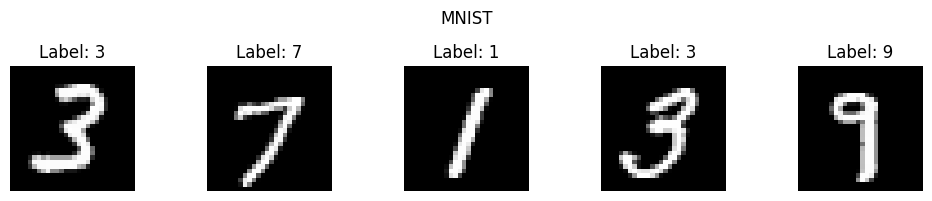

In [6]:
plot_images(mnist_images, mnist_labels, "MNIST")

#### COIL-20

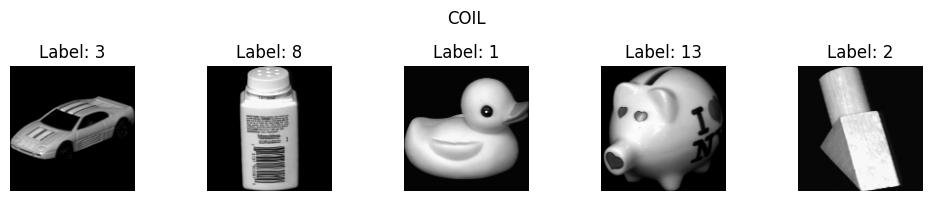

In [7]:
plot_images(coil_images, coil_labels, "COIL")

### Dataset Animations

#### COIL-20

We will now display the objects of coil-20 animated using the `animation` module in matplotlib

In [8]:
from matplotlib import animation
from IPython.display import Image

As our labels are all flattened within a 1d array. We can sort through the images by checking the index at which the image label changes.

In [9]:
coil_indexes = [0] + [i+1 for i in range(len(coil_labels)-1) if coil_labels[i] != coil_labels[i+1]] + [len(coil_labels)]

We first create the images using the animation library, then direct all output to the `gifs/` folder. Let us consider the image class 16 for instance.

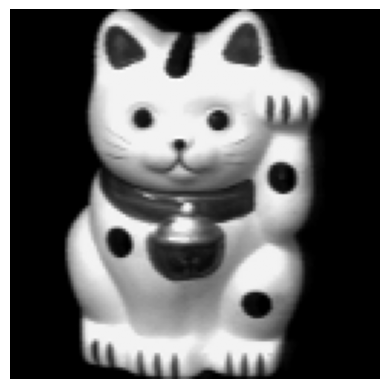

In [10]:
i = 2
start_idx = coil_indexes[i]
end_idx = coil_indexes[i+1]
coil_sequence = coil_images[start_idx:end_idx]

fig, ax = plt.subplots()
ax.axis("off")
im = ax.imshow(coil_sequence[0], cmap="gray")

def update(frame):
    im.set_array(coil_sequence[frame])
    return [im]

ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(coil_sequence),
    interval=100,
    blit=False
)
output_dir = "gifs"
os.makedirs(output_dir, exist_ok=True)
ani.save(f"{output_dir}/coil_animation{i}.gif", writer="pillow", fps=10)


This gives us the following gif:

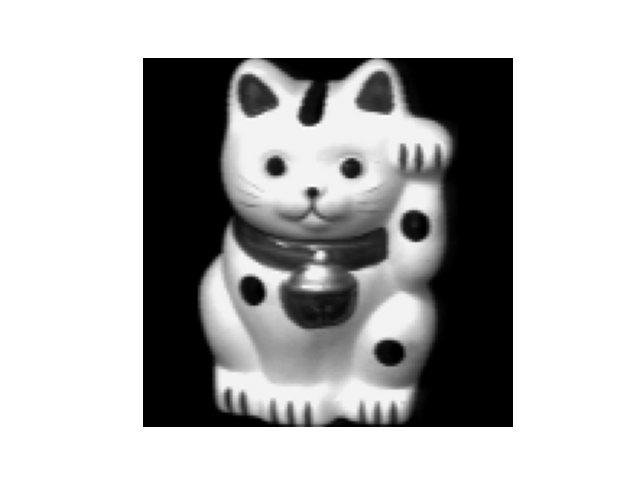

In [11]:
Image(filename=f"{output_dir}/coil_animation{i}.gif")

#### MNIST

Operating nearly the same way, let us pick the number 7 from the MNIST dataset and display its different image classes.

In [12]:
n = 7
mnist_sequence = [mnist_images[i] for i in range(len(mnist_labels)) if mnist_labels[i] == n]
# limit the sequence to only 100 images
mnist_sequence = mnist_sequence[:100]

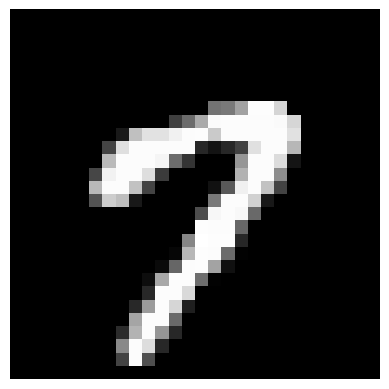

In [13]:
fig, ax = plt.subplots()
ax.axis("off")
im = ax.imshow(mnist_sequence[0], cmap="gray")

def update(frame):
    im.set_array(mnist_sequence[frame])
    return [im]

ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(mnist_sequence),
    interval=100,
    blit=False
)

ani.save(f"{output_dir}/mnist_animation{n}.gif", writer="pillow", fps=10)

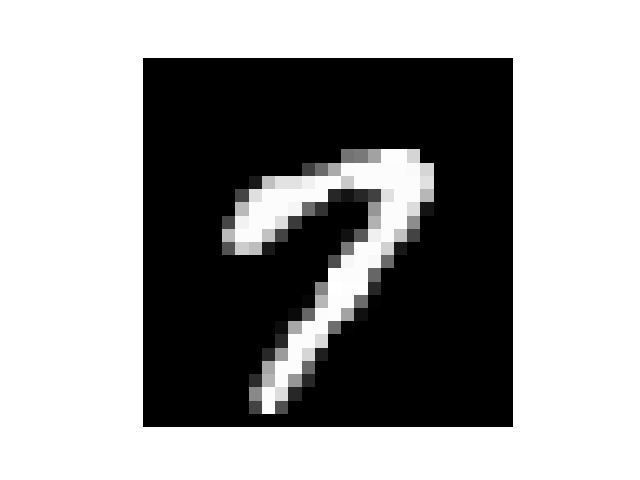

In [14]:
Image(filename=f"{output_dir}/mnist_animation7.gif")

## Data Preprocessing

In [15]:
# additional needed imports for preprocessing
from sklearn.preprocessing import StandardScaler

We will follow this normalization pipeline for the best results later on:

1. Resize to 28x28
2. Flatten to 1D vectors
3. Standard scaling (z-score normalization)
4. Min-max scaling (0-1 normalization)

In order to optimize run-time for all subseding computations, it is best to first reduce the size of the images of the **MNIST** and **COIL-20** datasets.

In [16]:
def reduce_image_size(image, size=(28, 28)):
    return cv2.resize(image, size, interpolation=cv2.INTER_AREA)

mnist_resized = np.array([reduce_image_size(img) for img in mnist_images])

coil_resized = np.array([reduce_image_size(img) for img in coil_images])

To normalize our data using scikit-learn's `Standard Scaler`, it needs to be initially flattened to a 1D array.

In [17]:
# flattening the images:
mnist_flat = mnist_resized.reshape(mnist_resized.shape[0], -1)
coil_flat = coil_resized.reshape(coil_resized.shape[0], -1)

# fit within pandas dataframes with labels
mnist_df = pd.DataFrame(mnist_flat)
mnist_df['label'] = mnist_labels

coil_df = pd.DataFrame(coil_flat)
coil_df['label'] = coil_labels

In [18]:
print(f"MNIST shape: {mnist_df.shape}")
display(mnist_df.head())
print(f"COIL shape: {coil_df.shape}")
display(coil_df.head())

MNIST shape: (70000, 785)


,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9


COIL shape: (1440, 785)


,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5


Now that it is flattened, it is fit for normalization. 

In [19]:
scaler = StandardScaler()
mnist_normalized = scaler.fit_transform(mnist_flat)
coil_normalized = scaler.fit_transform(coil_flat)

## Data Visualization

### Heatmaps

We can start by working on defining how this normalized data should be mapped.

One approach, suggested by the assignment, is to use the `z-score` which relies on the mean of the images of each class and compares how each image within that class fits into it.



In [20]:
def compute_class_means(normalized_data, labels, unique_labels, image_shape):
    class_means = []
    for label in unique_labels:
        mask = labels == label
        class_data = normalized_data[mask]
        class_mean = np.mean(class_data, axis=0)
        class_means.append(class_mean.reshape(image_shape))
    return class_means

def plot_class_heatmaps(normalized_data, labels, class_names, image_shape, title, nrows, ncols):
    unique_labels = np.unique(labels)
    n_classes = len(unique_labels)
    class_means = compute_class_means(normalized_data, labels, unique_labels, image_shape)

    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 3*nrows))
    for i, ax in enumerate(axes.flat):
        if i < n_classes:
            sns.heatmap(class_means[i], ax=ax, cmap='RdBu', center=0, cbar=False)
            ax.set_title(f"{class_names[i]}")
            ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

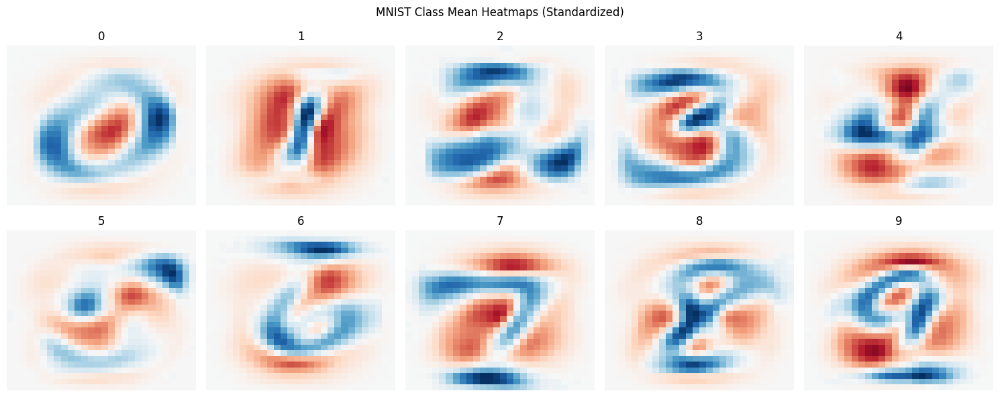

In [21]:
# MNIST Heatmaps
mnist_class_names = [str(i) for i in range(10)]
plot_class_heatmaps(mnist_normalized, mnist_labels, mnist_class_names, (28, 28),
                    "MNIST Class Mean Heatmaps (Standardized)", 2, 5)

Patterns are already starting to emerge, as we notice the images of each class have certain lines that always overlap for the **MNIST** dataset.

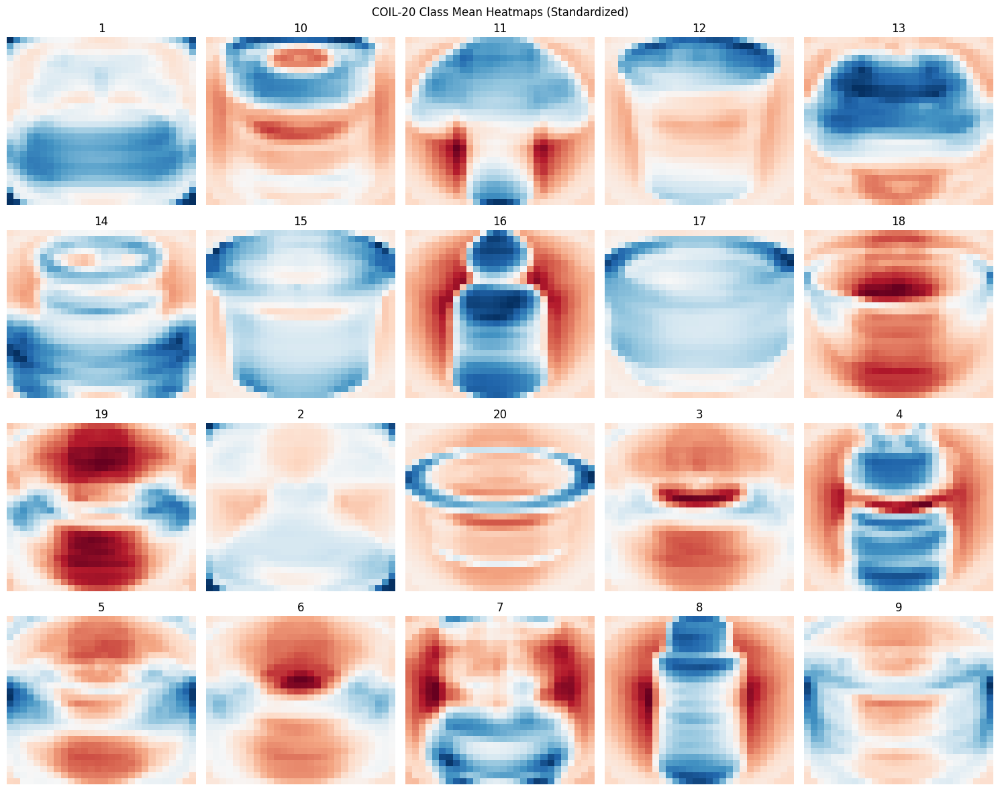

In [22]:
# COIL-20 Heatmaps
coil_class_names = np.unique(coil_labels)
plot_class_heatmaps(coil_normalized, coil_labels, coil_class_names, (28, 28),
                    "COIL-20 Class Mean Heatmaps (Standardized)", 4, 5)

The rotation effect of the coil-20 images can be clearly perceived with these heatmaps, the setback however is that certain shapes seem to overlap, especially the overtly simple cylindrical shapes.

### Parallel Plots

There was an initial trial at modelling all 70000 samples of the data- That caused my laptop to crash twice. For that reason we will be modelling only a sample of the data for the `mnist` dataset.

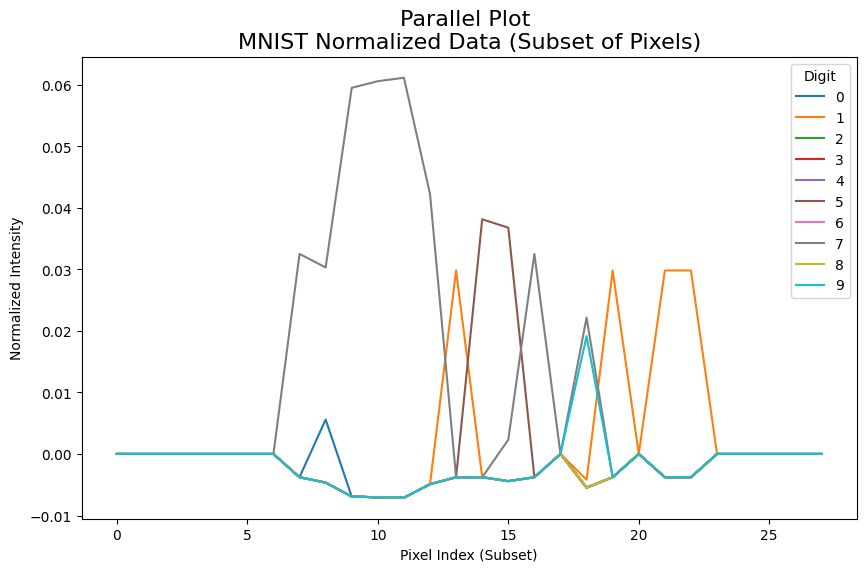

In [23]:
subset_idx = np.random.choice(mnist_normalized.shape[0], 100, replace=False)
mnist_subset = mnist_normalized[subset_idx]

# average pixel intensities per class to avoid overcrowding
unique_labels = np.unique(mnist_labels)
class_means = np.array([mnist_normalized[mnist_labels == label].mean(axis=0) for label in unique_labels])

# selecting a subset of pixels
selected_features = np.arange(0, 784, 28)
class_means_subset = class_means[:, selected_features]

# converting to pandas dataframe for optimized rendering
df = pd.DataFrame(class_means_subset.T, columns=unique_labels)

plt.figure(figsize=(10, 6))
parallel_plot = sns.lineplot(data=df, dashes=False, markers=False)

plt.title('Parallel Plot \nMNIST Normalized Data (Subset of Pixels)', fontsize=16)
plt.xlabel("Pixel Index (Subset)")
plt.ylabel("Normalized Intensity")
plt.legend(title='Digit', bbox_to_anchor=(1, 1))  # Shift legend to the right
plt.show()

The pixel classes are largely situated in the middle, which is logical considering the heatmaps we observed earlier of the mnist images.

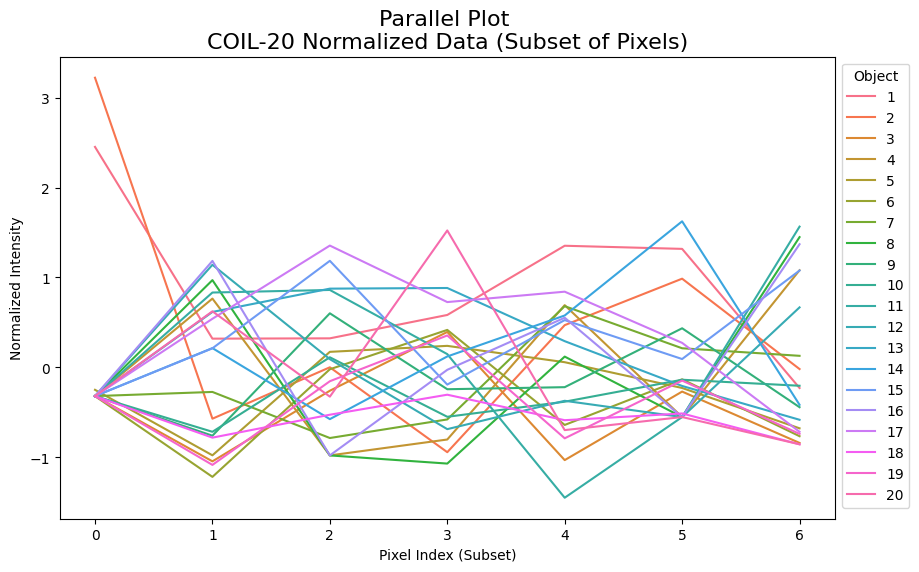

In [24]:
subset_idx = np.random.choice(coil_normalized.shape[0], 100, replace=False)
coil_subset = coil_normalized[subset_idx]

unique_labels = sorted(np.unique(coil_labels), key=lambda x: int(x))
class_means = np.array([coil_normalized[coil_labels == label].mean(axis=0) for label in unique_labels])

selected_features = np.arange(0, coil_normalized.shape[1], 128)  # Adjust stride for COIL-20
class_means_subset = class_means[:, selected_features]

df = pd.DataFrame(class_means_subset.T, columns=unique_labels)

plt.figure(figsize=(10, 6))
parallel_plot = sns.lineplot(data=df, dashes=False, markers=False)

plt.title('Parallel Plot \nCOIL-20 Normalized Data (Subset of Pixels)', fontsize=16)
plt.xlabel("Pixel Index (Subset)")
plt.ylabel("Normalized Intensity")
plt.legend(title='Object', bbox_to_anchor=(1, 1))
plt.show()

## Dimensionality Reduction

From the **IBM Machine Learning Documentation**:

> Dimensionality reduction simplifies datasets by reducing the number of features while preserving key patterns. This preprocessing technique eliminates irrelevant, redundant, or noisy variables by transforming high-dimensional data into lower-dimensional representations through feature extraction or combination.

We will be exploring in this guise three methods: **PCA**, **t-SNE** and **UMAP**. Each one will be explored for the case of **2D** and **3D** dimensionality reduction and compared.

In [25]:
import time
import psutil
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, silhouette_score
from nxcurve import quality_curve

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

Before getting to the methods, we define the following function for testing accurately the results for each method in addition to any visualization comparisons.

In [90]:
def evaluate_method(method, data, labels, **kwargs):
    """
    Evaluate the given dimensionality reduction method and collect metrics.
    
    Parameters:
        method (str): 'PCA', 't-SNE', or 'UMAP'
        data (np.ndarray): High-dimensional data.
        labels (np.ndarray): Ground truth labels.
        kwargs: method-specific parameters.
    
    Returns:
        reduced (np.ndarray): Reduced data.
        accuracy (float): Classification accuracy (%) using KNN.
        exec_time (float): Execution time in seconds.
        memory_used (float): Memory used in MB.
        quality_score (float): Silhouette score to approximate quality.
    """
    
    # record starting memory and time
    process = psutil.Process()
    mem_before = process.memory_info().rss / 1024 / 1024  # bytes to MB
    start_time = time.time()
    
    reducer = method(**kwargs)
    reduced = reducer.fit_transform(data)
    
    # execution time and memory usage
    exec_time = time.time() - start_time
    mem_after = process.memory_info().rss / 1024 / 1024  # in MB
    memory_used = mem_after - mem_before
    
    # classification accuracy on reduced data using a KNN classifier
    X_train, X_test, y_train, y_test = train_test_split(reduced, labels, test_size=0.3, random_state=42)
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train, y_train)
    accuracy = accuracy_score(y_test, knn.predict(X_test)) * 100  # as percentage
    
    # quality metric: silhouette score on the reduced features
    quality_score = silhouette_score(reduced, labels)
    
    metrics = [
        accuracy,
        exec_time,
        memory_used,
        quality_score
    ]
    
    return reducer, reduced, metrics

### PCA 

>**Principal component analysis**, or PCA, reduces the number of dimensions in large datasets to principal components that retain most of the original information. It does this by transforming potentially correlated variables into a smaller set of variables, called principal components.

It is by far the most popular dimensionality reduction method as it is computationally fast and easy to interpret mathematically. Thanks to its linear algebra approach, it is also well adapted to preserving the global structure.

#### Testing with 2D

The function below is designed to visualize the 2D results for the MNIST and COIL-20 datasets. 

It plots the first two principal components in a 2D plane using scatterplots. Additionally, it includes class mean markers, which represent the average position of elements within each class, providing insight into how clusters align with their respective means. Red arrow markers are also displayed to indicate variance, where longer arrows signify greater variance.

In [27]:
def plot_pca(scores, loadings, labels, title, colors):
    # plotting the pca results
    plt.figure(figsize=(12, 8))

    scatter = plt.scatter(scores[:, 0], scores[:, 1], c=labels, alpha=0.5, cmap=colors)
    plt.xlabel("PC1")
    plt.ylabel("PC2")

    # class means markers
    unique_labels = np.unique(labels)
    class_means = np.array(compute_class_means(scores, labels, unique_labels, (2,)))

    plt.scatter(class_means[:, 0], class_means[:, 1], c=unique_labels, cmap=colors,
                s=200, edgecolor='k', marker='D', label='Class Means')

    # red arrows to check variance
    for i, (x, y) in enumerate(loadings):
        plt.arrow(0, 0, x, y, color='r', width=0.01, head_width=0.05)
        plt.text(x * 1.2, y * 1.2, f"Pixel{i}", color='r')

    cbar = plt.colorbar(scatter, ticks=np.arange(len(unique_labels)), cmap=colors)
    cbar.set_label('Digit')
    cbar.set_ticklabels(np.arange(len(unique_labels)))

    plt.title(title)
    plt.legend()
    plt.show()

##### MNIST

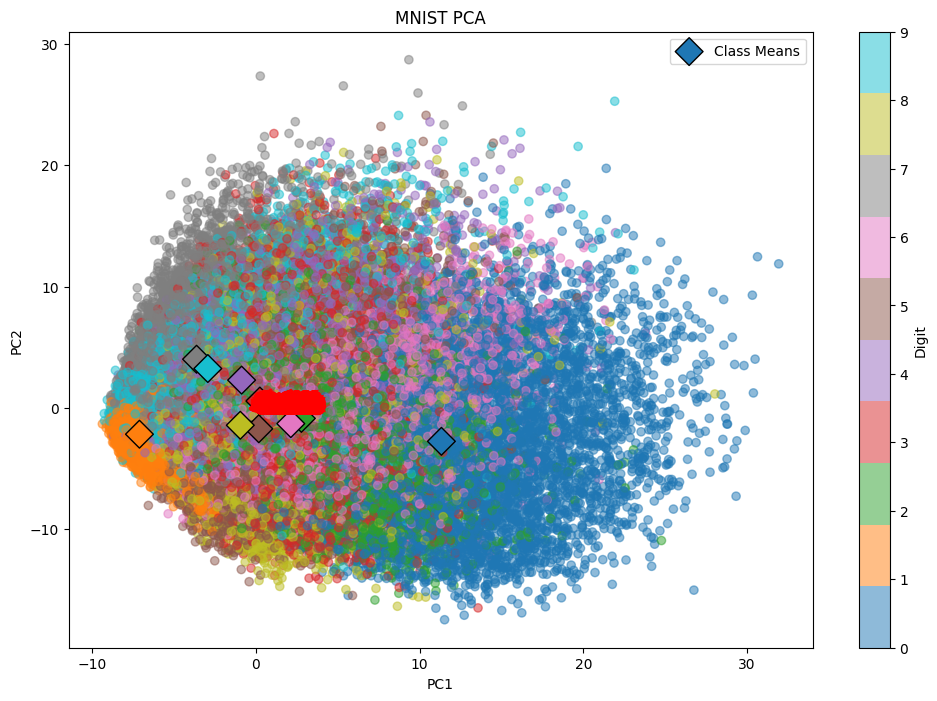

In [91]:
mnPCA2, mnPCA2_data, mnPCA2_met = evaluate_method(PCA, mnist_normalized, mnist_labels, n_components=2)
loadings = mnPCA2.components_.T * np.sqrt(mnPCA2.explained_variance_)
plot_pca(mnPCA2_data, loadings, mnist_labels, "MNIST PCA", "tab10")

From the principal components extracted and the red arrows points, we notice that the zero shape is the most influential in placing the numbers. The data still is quite packed, but we can notice some clusters, particularly for the numbers 0, 1 and 7.

We can already notice how the pca has divided the data so that 7 is closer to 1 than to 0, and most of the numbers fall between the two extremes.

Very little variance exists between the different data points, as they are all tightly clustered together, let us see how we can amend to this.

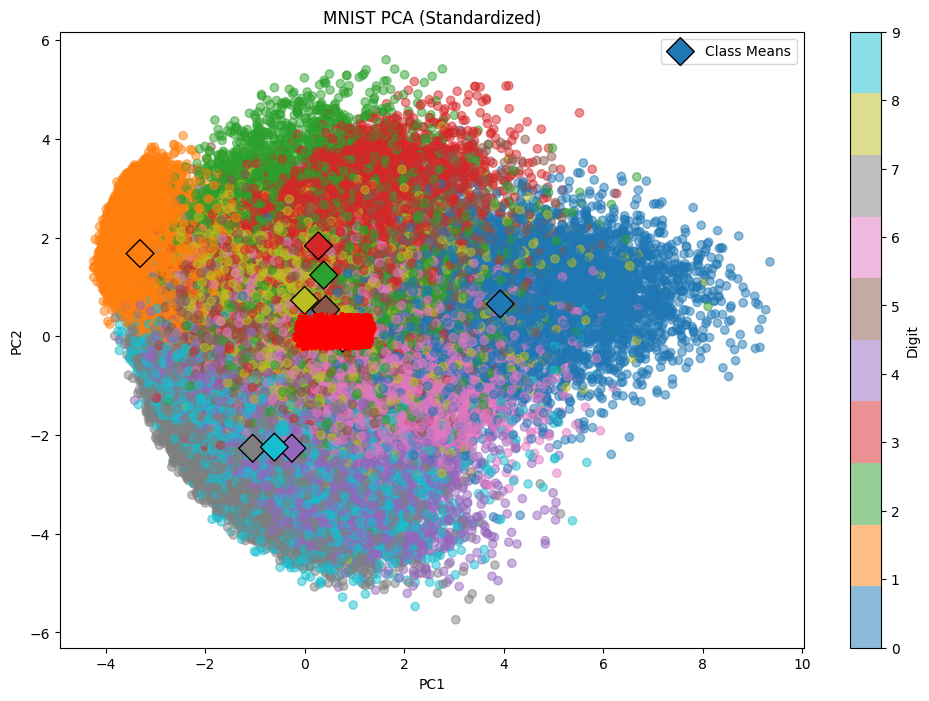

In [ ]:
mnist_norm_minmax = mnist_flat / 255.0

mnPCA2, mnPCA2_data, mnPCA2_met = evaluate_method(PCA, mnist_norm_minmax, mnist_labels, n_components=2)

loadings = mnPCA2.components_.T * np.sqrt(mnPCA2.explained_variance_)
plot_pca(mnPCA2_data, loadings, mnist_labels, "MNIST PCA (Standardized)", "tab10")

The data now is noticeably more separated than before, with the meshing being severe mostly between the numbers 4, 9 and to a lesser extent 5, which is to be expected given their shape similarity.

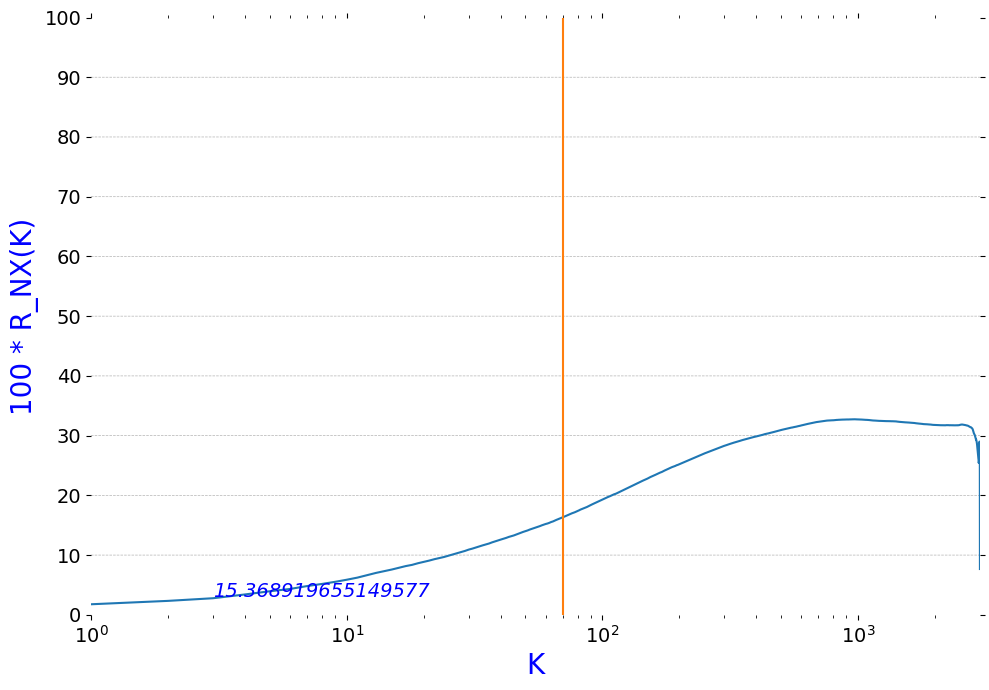

(array([0.01033667, 0.01767823, 0.02335636, ..., 0.2144364 , 0.10590374,
        0.07669213], shape=(2998,)),
 np.float64(0.15368919655149577),
 'R_NX(K)')

In [30]:
mnist_sample, _, scores_sample, _ = train_test_split(
    mnist_norm_minmax, mnPCA2_data,
    train_size=3000,
    random_state=42
)

nearest_neighbors = 70
quality_curve(scores_sample, mnist_sample, nearest_neighbors, 'r', True)

##### COIL-20 

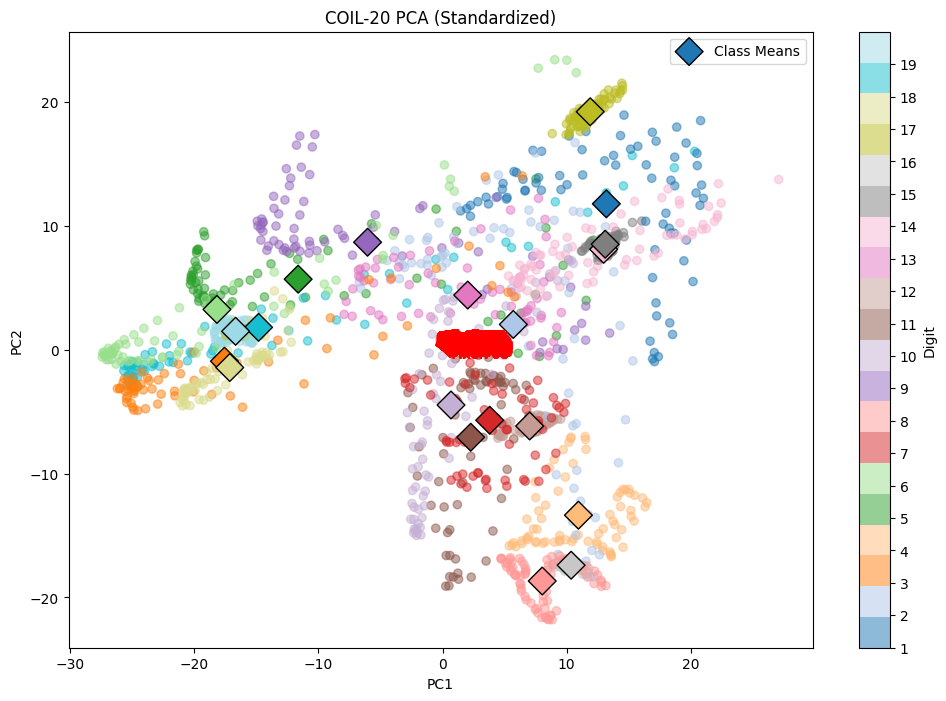

In [ ]:
coilPCA2, coilPCA2_data, coilPCA2_met = evaluate_method(PCA, coil_normalized, coil_labels, n_components=2)

loadings = coilPCA2.components_.T * np.sqrt(coilPCA2.explained_variance_)

coil_labels = np.array([int(label) for label in coil_labels])
plot_pca(coilPCA2_data, loadings, coil_labels, "COIL-20 PCA (Standardized)", "tab20")

The data for the coil-20 dataset is noticeably more varied and less clustered, with close values sticking together.

#### Testing with 3D

The `plot_pca_3d` function visualizes PCA results in 3D, showing data points colored by labels and feature loadings as arrows. This helps interpret variance across the first three principal components and understand feature contributions. It uses Matplotlib’s 3D plotting (`ax`) for better insight into data structure and clustering.

In [32]:
def plot_pca_3d(scores, loadings, labels, title, colors):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(scores[:, 0], scores[:, 1], scores[:, 2],
                         c=labels, alpha=0.5, cmap=colors)

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")

    for i, (x, y, z) in enumerate(loadings):
        ax.quiver(0, 0, 0, x, y, z, color='r', arrow_length_ratio=0.1)
        ax.text(x * 1.2, y * 1.2, z * 1.2, f"Pixel{i}", color='r')

    cbar = fig.colorbar(scatter, ticks=np.arange(len(unique_labels)), shrink=0.6)
    cbar.set_label('Digit')
    cbar.set_ticklabels(np.arange(len(unique_labels)))

    ax.set_title(title)
    plt.legend()
    plt.show()

##### MNIST

In [ ]:
mnPCA3, mnPCA3_data, mnPCA3_met = evaluate_method(PCA, mnist_norm_minmax, mnist_labels, n_components=3)

loadings = mnPCA3.components_.T * np.sqrt(mnPCA3.explained_variance_)

/tmp/ipykernel_4147/1257771326.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


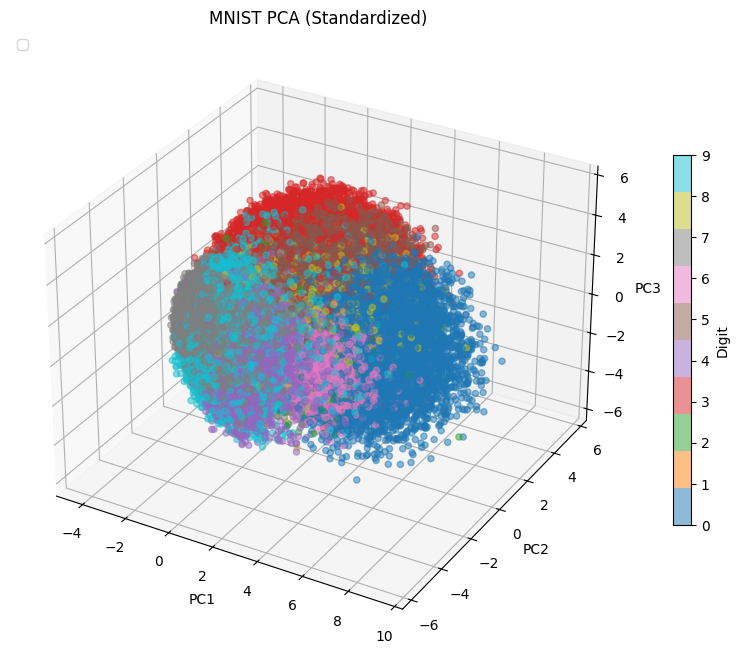

In [34]:
plot_pca_3d(mnPCA3_data, loadings, mnist_labels, "MNIST PCA (Standardized)", "tab10")

We can observe a bit of distinction but not by a large margin, the variance is still fairly low

In [35]:
mnPCA3.explained_variance_ratio_

array([0.09746116, 0.07155445, 0.06149531])

##### COIL-20

/tmp/ipykernel_4147/1257771326.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


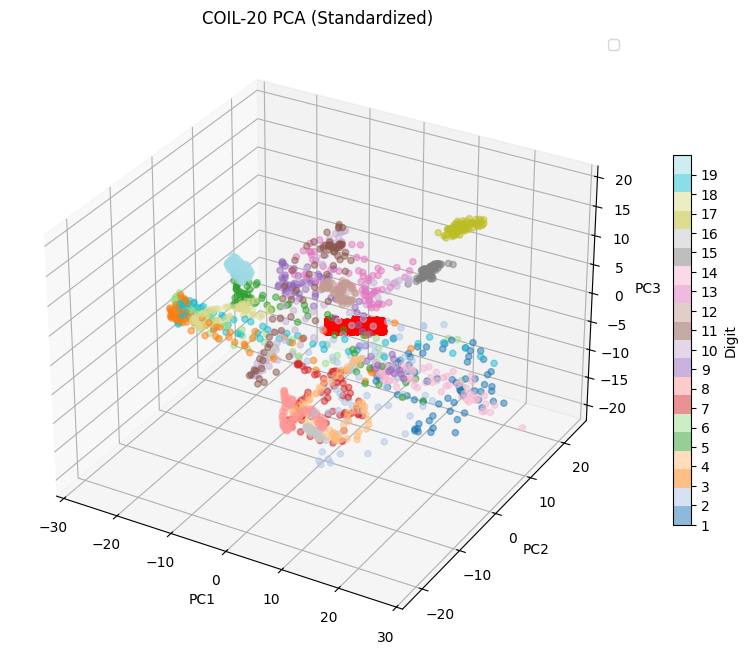

In [ ]:
coilPCA3, coilPCA3_data, coilPCA3_met = evaluate_method(PCA, coil_normalized, coil_labels, n_components=3)

loadings = coilPCA3.components_.T * np.sqrt(coilPCA3.explained_variance_)

plot_pca_3d(coilPCA3_data, loadings, coil_labels, "COIL-20 PCA (Standardized)", "tab20")

We can see that some of the data has been clearly separated, reducing the variance.

However some clusters, especially for object 18, are too scattered.

### t-SNE

From the **DataCamp Website**:
>**t-SNE (t-distributed Stochastic Neighbor Embedding)** is an unsupervised non-linear dimensionality reduction technique for data exploration and visualizing high-dimensional data. Non-linear dimensionality reduction means that the algorithm allows us to separate data that cannot be separated by a straight line.

Unlike PCA, t-SNE captures complex, non-linear structures—making it well-suited for datasets like MNIST and COIL-20, where class boundaries aren't linearly separable. However, as we will see later on, it is much more computationally intensive than PCA.

#### Testing with 2D

##### MNIST 

Tweaking the t-SNE method for the MNIST dataset proved challenging. Initially, computations were unfeasible due to the large dataset size. Once execution was achieved, the output was questionable, with the final **Kullback-Leibler divergence (KL)** divergence consistently exceeding Python's maximum float limit. We determined that increasing the number of iterations from 250 to 300 allowed the algorithm sufficient time to converge, resolving the issue.

In [ ]:
mnTSNE2, mnTSNE2_data, mnTSNE2_met = evaluate_method(TSNE, mnist_norm_minmax, mnist_labels, n_components=2, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

mnTSNE2.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.035s...
[t-SNE] Computed neighbors for 70000 samples in 72.905s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for sa

4.470048427581787

The KL divergence metric ranges from 0 to 10, with lower values indicating better preservation of structure during dimensionality reduction. Given the large size and complexity of our dataset, achieving a value of 4.47 suggests that t-SNE has performed robustly. We will further explore in the [Hyperparameter Tuning](#hyperparameter-tuning) section what adjustments can yield better results.

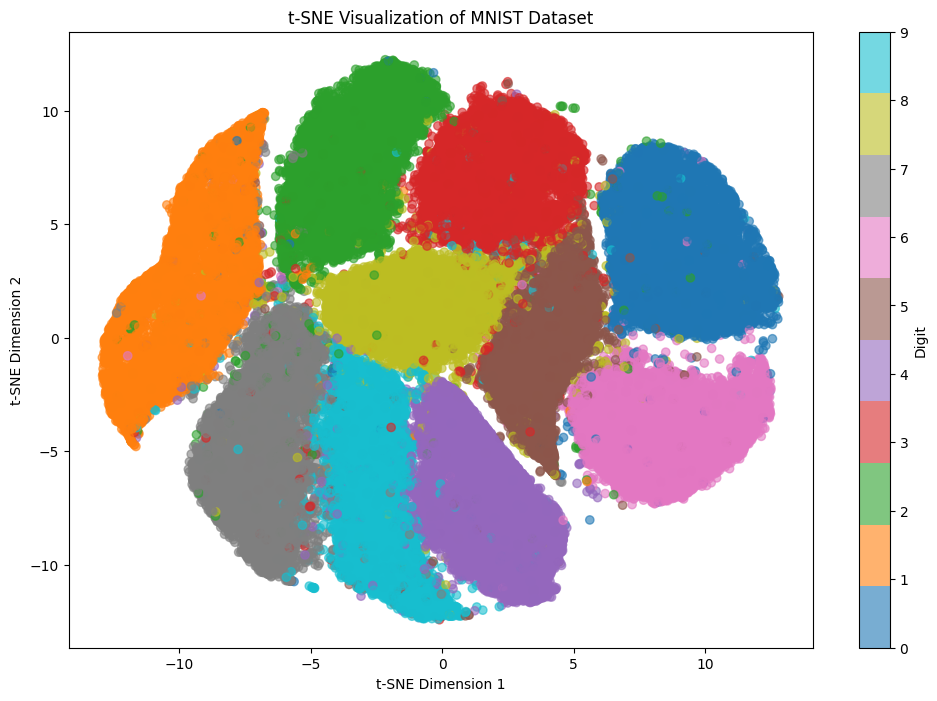

In [38]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(mnTSNE2_data[:, 0], mnTSNE2_data[:, 1], c=mnist_labels, cmap="tab10", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("t-SNE Visualization of MNIST Dataset")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

We notice that t-SNE in a 2D space gives us much beter results than PCA, with each number category properly clustered and separated and only a few intermingling values.

##### COIL-20

In [ ]:
coilTSNE2, coilTSNE2_data, coilTSNE2_met = evaluate_method(TSNE, coil_normalized, coil_labels, n_components=2, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

coilTSNE2.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1440 samples in 0.002s...
[t-SNE] Computed neighbors for 1440 samples in 0.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1440
[t-SNE] Computed conditional probabilities for sample 1440 / 1440
[t-SNE] Mean sigma: 7.149989
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.821373
[t-SNE] KL divergence after 300 iterations: 0.952434


0.9524338245391846

The value of the kl divergence is very small here, that might be cause for concern, as overtly small values might signal erroneous links.

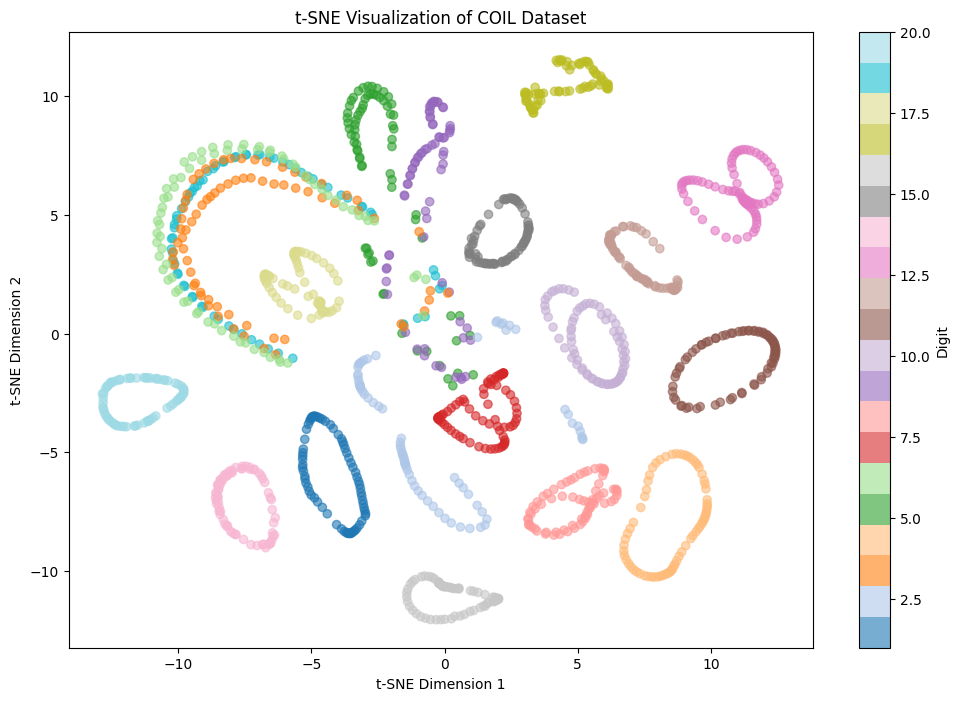

In [40]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(coilTSNE2_data[:, 0], coilTSNE2_data[:, 1], c=coil_labels, cmap="tab20", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("t-SNE Visualization of COIL Dataset")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

The clusters appear to be well-defined overall. The ring structure within each cluster might indicate how the rotations have been mapped for each object. However, some objects remain intertwined and mingled, which is not surprising given the heatmaps visualized earlier that showed certain cylindrical objects with nearly identical appearances.

#### Testing with 3D

##### MNIST

In [ ]:
mnTSNE3, mnTSNE3_data, mnTSNE3_met = evaluate_method(TSNE, mnist_norm_minmax, mnist_labels, n_components=3, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

mnTSNE3.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.032s...
[t-SNE] Computed neighbors for 70000 samples in 87.917s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for sa

3.97955322265625

The 3D reduction gives approximately the same result but slightly better with a lower KL divergence for the **MNIST** dataset.

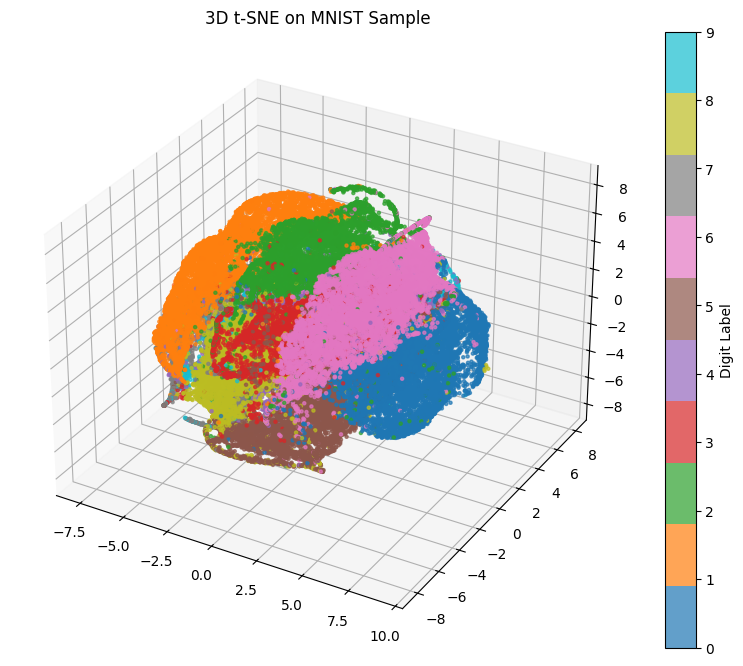

In [43]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    mnTSNE3_data[:, 0], 
    mnTSNE3_data[:, 1], 
    mnTSNE3_data[:, 2],
    c=mnist_labels,
    cmap='tab10',
    s=5, alpha=0.7
)

ax.set_title("3D t-SNE on MNIST Sample")
plt.colorbar(scatter, ax=ax, label='Digit Label')
plt.show()

The clustering for the **MNIST** dataset is much more neater and sparse than it was for PCA in 3D.

##### COIL-20

In [ ]:
coilTSNE3, coilTSNE3_data, coilTSNE3_met = evaluate_method(TSNE, coil_normalized, coil_labels, n_components=2, init= 'pca', method='barnes_hut', n_jobs=2, max_iter=300, verbose=1)

coilTSNE3.kl_divergence_

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1440 samples in 0.001s...
[t-SNE] Computed neighbors for 1440 samples in 0.111s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1440
[t-SNE] Computed conditional probabilities for sample 1440 / 1440
[t-SNE] Mean sigma: 7.149989
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.294693
[t-SNE] KL divergence after 300 iterations: 0.780314


0.7803135514259338

The value for the **COIL-20** dataset in 3D t-SNE has gotten even lower than it was for 2D, there might be need for tweaks later on for a better assessment.

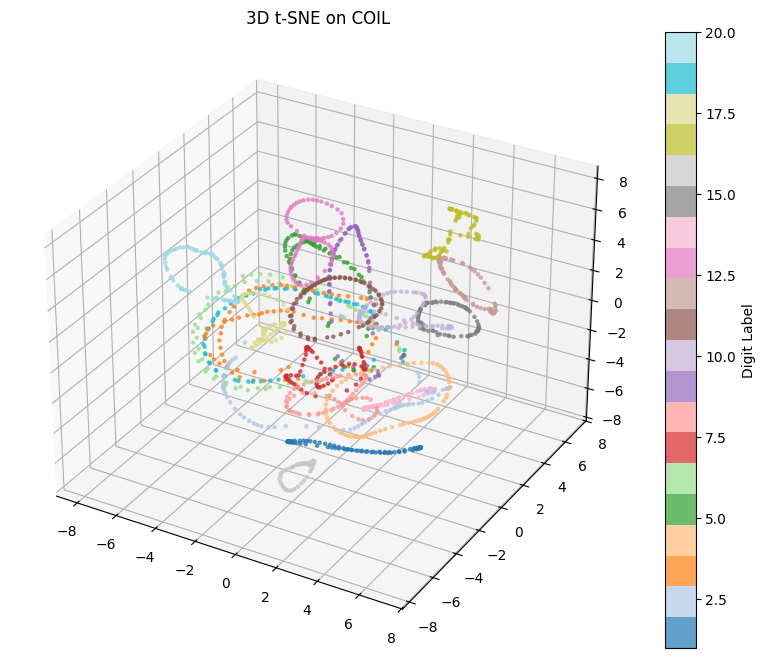

In [45]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    coilTSNE3_data[:, 0], 
    coilTSNE3_data[:, 1], 
    coilTSNE3_data[:, 2],
    c=coil_labels,
    cmap='tab20',
    s=5, alpha=0.7
)

ax.set_title("3D t-SNE on COIL")
plt.colorbar(scatter, ax=ax, label='Digit Label')
plt.show()

The values of the **COIL-20** dataset are very scattered though they do follow the ring pattern for each one.

### UMAP

>**UMAP** is a non-linear dimensionality reduction method that preserves local structure by modeling data as a fuzzy topological space. It is effective for visualizing complex datasets and offers faster performance than t-SNE with comparable results.

We will see below how well it performs with the datasets, again in both 2D and 3D cases.

#### Testing with 2D

##### MNIST

In [ ]:
mnUMAP2, mnUMAP2_data, mnUMAP2_met = evaluate_method(umap.UMAP, mnist_normalized, mnist_labels, n_components=2)

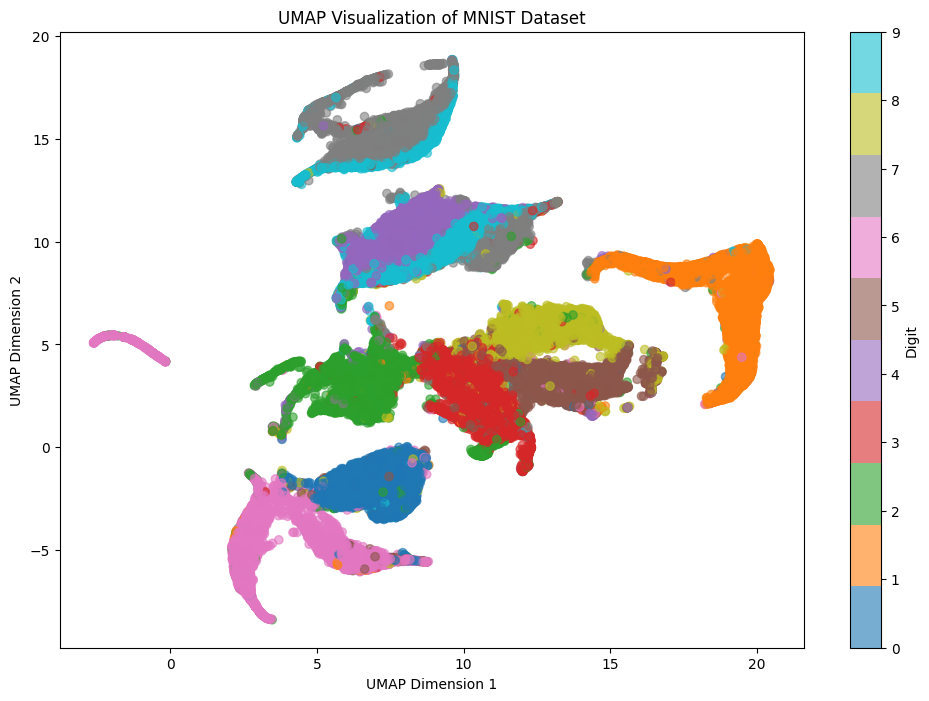

In [47]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(mnUMAP2_data[:, 0], mnUMAP2_data[:, 1], c=mnist_labels, cmap="tab10", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("UMAP Visualization of MNIST Dataset")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

The execution time is noticeably much less than it was for t-SNE, and provides remarkably more accurate results than PCA, though t-SNE's clustering is still more logical than the funny shaped graph we have here.

##### COIL-20

In [ ]:
coilUMAP2, coilUMAP2_data, coilUMAP2_met = evaluate_method(umap.UMAP, coil_normalized, coil_labels, n_components=2)

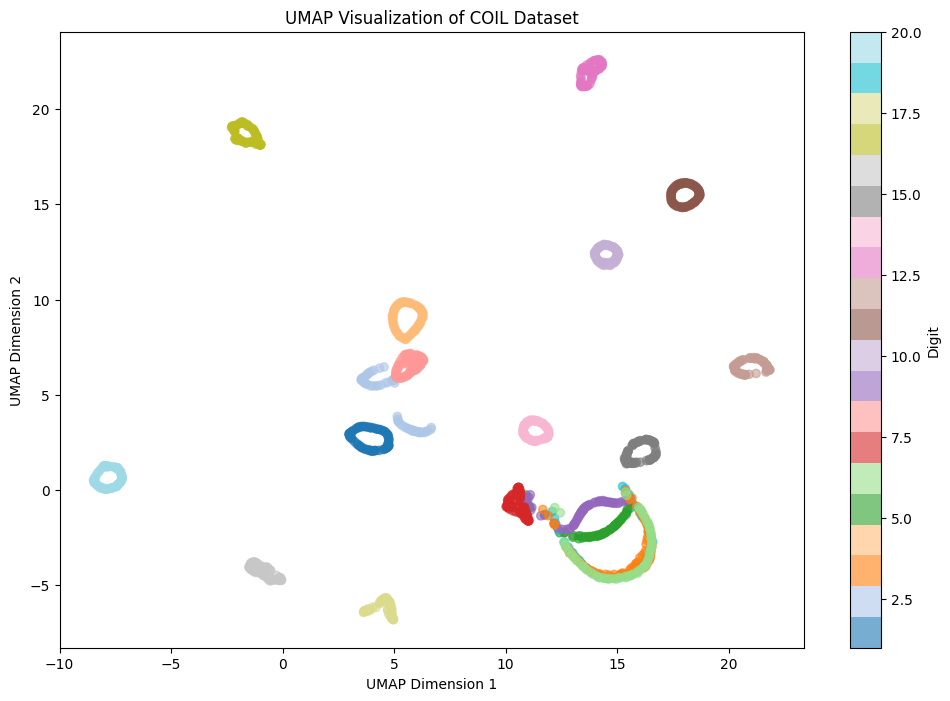

In [49]:
plt.figure(figsize=(12, 8))
scatter = plt.scatter(coilUMAP2_data[:, 0], coilUMAP2_data[:, 1], c=coil_labels, cmap="tab20", alpha=0.6)
plt.colorbar(scatter, label="Digit")
plt.title("UMAP Visualization of COIL Dataset")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

**UMAP** and **t-SNE** exhibit comparable performance in terms of execution time for the **COIL-20** dataset due to its smaller size. Both methods reveal the ring structure, but UMAP produces more refined results with smaller, more tightly clustered rings.

#### Testing with 3D

##### MNIST

In [ ]:
mnUMAP3, mnUMAP3_data, mnUMAP3_met = evaluate_method(umap.UMAP, mnist_normalized, mnist_labels, n_components=3)

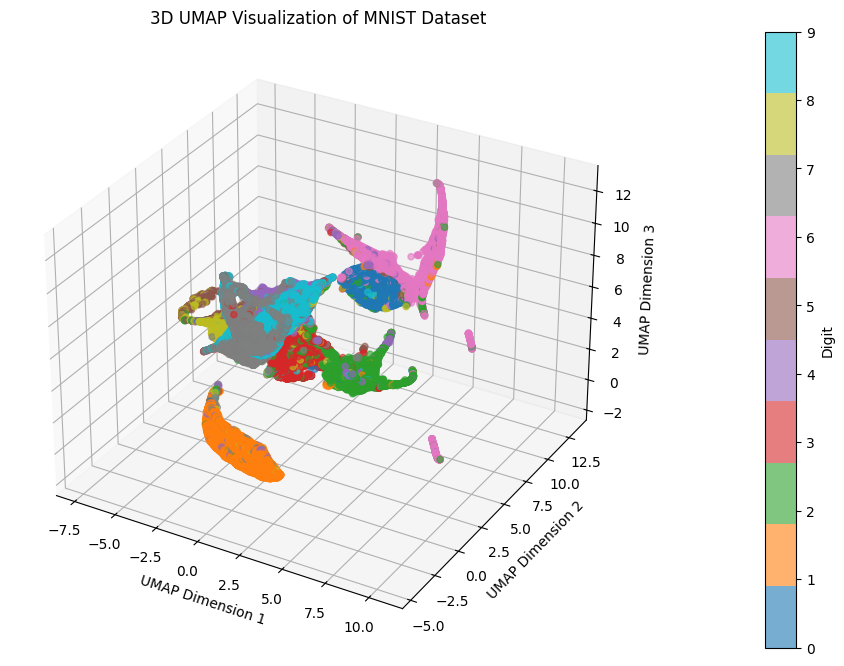

In [51]:
plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

scatter = ax.scatter3D(
    mnUMAP3_data[:, 0], 
    mnUMAP3_data[:, 1], 
    mnUMAP3_data[:, 2], 
    c=mnist_labels, 
    cmap="tab10", 
    alpha=0.6
)

plt.colorbar(scatter, label="Digit", pad=0.15)
ax.set_title("3D UMAP Visualization of MNIST Dataset")
ax.set_xlabel("UMAP Dimension 1")
ax.set_ylabel("UMAP Dimension 2")
ax.set_zlabel("UMAP Dimension 3")
plt.show()

**UMAP** still performs much better timewise in the **MNIST** dataset for the 3D visualization, taking only about *30 seconds* compared to the *11 minutes* of **t-SNE**. Its clusters however are not as neat and seem to intermingle a lot more, it is however still much better than **PCA**.

##### COIL-20

In [ ]:
coilUMAP3, coilUMAP3_data, coilUMAP3_met = evaluate_method(umap.UMAP, coil_normalized, coil_labels, n_components=3)

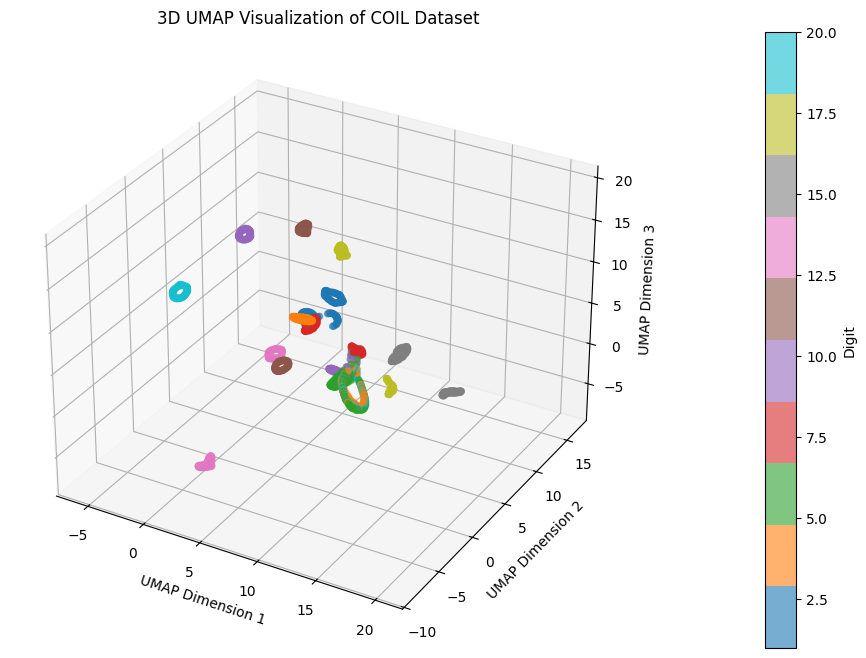

In [53]:
plt.figure(figsize=(12, 8))
ax = plt.axes(projection='3d')

scatter = ax.scatter3D(
    coilUMAP3_data[:, 0], 
    coilUMAP3_data[:, 1], 
    coilUMAP3_data[:, 2], 
    c=coil_labels, 
    cmap="tab10", 
    alpha=0.6
)

plt.colorbar(scatter, label="Digit", pad=0.15)
ax.set_title("3D UMAP Visualization of COIL Dataset")
ax.set_xlabel("UMAP Dimension 1")
ax.set_ylabel("UMAP Dimension 2")
ax.set_zlabel("UMAP Dimension 3")
plt.show()

As it was with the 2D visualization, **UMAP** and **t-SNE** perform very similarly timewise for the **COIL-20** dataset. Though **UMAP** yields better results in both cases and clearer definitions for the objects.

### Evaluations and Performance Analysis

The RNX quality curve quantifies how well a dimensionality reduction method preserves local neighborhood relationships. It compares the ranking of neighbors in the high-dimensional space to that in the low-dimensional embedding over various neighborhood sizes. A more favorable (lower) RNX curve indicates that the method better maintains the intrinsic data structure during the reduction process.

The default graph of the `quality_curve` function produces only one method per graph, we will thus implement the method `add_curve()` in order to handle multiple methods within the same curve for a better assessment of performance.

In [71]:
methods = ['PCA', 'tSNE', 'UMAP']

def add_curve(ax, curve_data, area, label):
    size = curve_data.shape[0] + 1
    v = np.arange(size - 1)
    label = "method: {} area: {}".format(label, round(area * 100, 3))
    ax.plot(v, 100 * curve_data, label=label, marker="o", markevery=0.1)
    return ax

For the MNIST dataset:

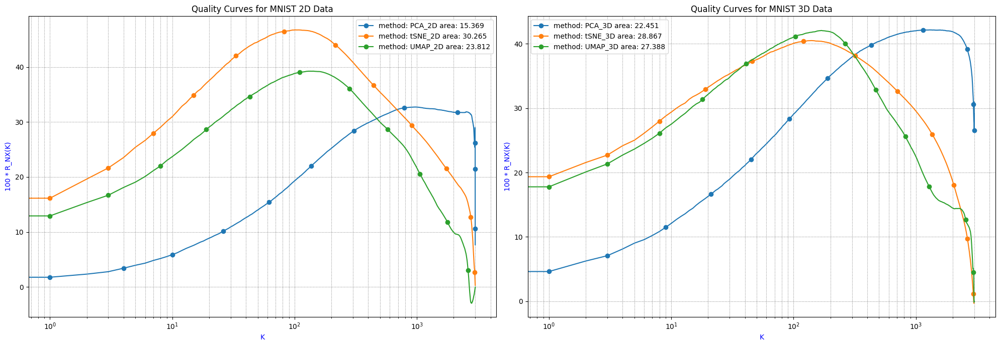

In [74]:
nearest_neighbors = 100
data_dict = {
    '2D': [mnPCA2_data, mnTSNE2_data, mnUMAP2_data],
    '3D': [mnPCA3_data, mnTSNE3_data, mnUMAP3_data]
}

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
for i, dim in enumerate(['2D', '3D']):
    ax = axes[i] 
    samples = {}
    data_list = data_dict[dim]
    for method, method_data in zip(methods, data_list):
        mnist_sample, _, data_sample, _ = train_test_split(mnist_norm_minmax, method_data, train_size=3000, random_state=42)
        samples[method] = {'mnist_sample': mnist_sample, 'data_sample': data_sample}
    for method in methods:
        d = samples[method]
        curve_data, area, curve_name = quality_curve(d['data_sample'], d['mnist_sample'], nearest_neighbors, 'r', False)
        ax = add_curve(ax, curve_data, area, f'{method}_{dim}')
    ax.set_xlabel('K', fontsize=10, color="blue")
    ax.set_ylabel('100 * ' + curve_name, fontsize=10, color="blue")
    ax.set_xscale('log')
    ax.set_title(f"Quality Curves for MNIST {dim} Data")
    ax.grid(True, which="both", ls='dotted', color='0.5')
    ax.legend()
plt.tight_layout()
plt.show()

All of the methods used so far don't seem to perform very well for the quality curve RNX on the **MNIST** dataset, though t-SNE does fare better than the others with overall better scores for both 2D and 3D.

For the COIL-20 dataset:

/tmp/ipykernel_4147/1428651948.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


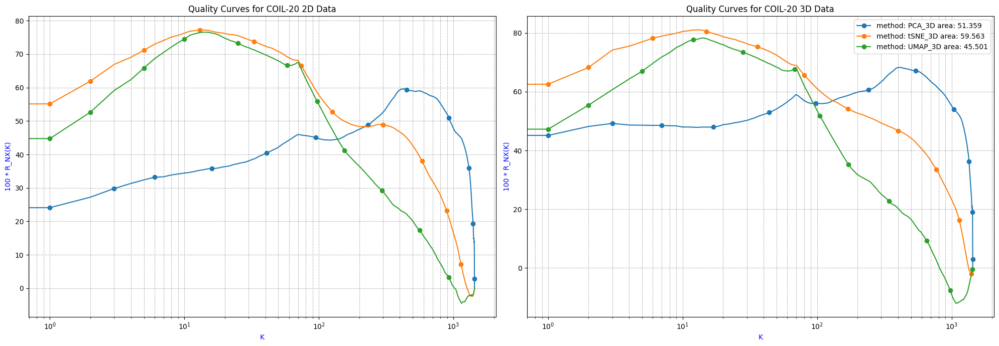

In [ ]:
nearest_neighbors = 12
data_dict = {
    '2D': [coilPCA2_data, coilTSNE2_data, coilUMAP2_data],
    '3D': [coilPCA3_data, coilTSNE3_data, coilUMAP3_data]
}

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
for i, dim in enumerate(['2D', '3D']):
    ax = axes[i]
    data_list = data_dict[dim]
    for method, method_data in zip(methods, data_list):
        curve_data, area, curve_name = quality_curve(coil_normalized, method_data, nearest_neighbors, 'r', False)
        ax = add_curve(ax, curve_data, area, f'{method}_{dim}')
    ax.set_xlabel('K', fontsize=10, color="blue")
    ax.set_ylabel('100 * ' + curve_name, fontsize=10, color="blue")
    ax.set_xscale('log')
    ax.grid(True, which="both", ls='dotted', color='0.5')
    ax.set_title(f"Quality Curves for COIL-20 {dim} Data")
    ax.legend()
plt.tight_layout()
plt.show()

We will now collect the results of the metrics for each method as obtained in the `evaluate_method()` function and compare the methods in more detail in this `results` pandas dataframe below.

In [82]:
index = pd.MultiIndex.from_product(
    [['MNIST', 'COIL-20'], ['2D', '3D'], ['PCA', 't-SNE', 'UMAP']],
    names=["Dataset", "Method", "Dimension"]
)

columns = pd.MultiIndex.from_tuples([
    ('Performance', 'Accuracy (%)'),
    ('Performance', 'Time (s)'),
    ('Performance', 'Memory (MB)'),
    ('Quality', 'Cluster Score')
])

results = pd.DataFrame(index=index, columns=columns)


In [83]:
# metrics for MNIST dataset
results.loc[('MNIST', '2D', 'PCA'), :] = mnPCA2_met
results.loc[('MNIST', '3D', 'PCA'), :] = mnPCA3_met
results.loc[('MNIST', '2D', 't-SNE'), :] = mnTSNE2_met
results.loc[('MNIST', '3D', 't-SNE'), :] = mnTSNE3_met
results.loc[('MNIST', '2D', 'UMAP'), :] = mnUMAP2_met
results.loc[('MNIST', '3D', 'UMAP'), :] = mnUMAP3_met

# metrics for COIL-20 dataset
results.loc[('COIL-20', '2D', 'PCA'), :] = coilPCA2_met
results.loc[('COIL-20', '3D', 'PCA'), :] = coilPCA3_met
results.loc[('COIL-20', '2D', 't-SNE'), :] = coilTSNE2_met
results.loc[('COIL-20', '3D', 't-SNE'), :] = coilTSNE3_met
results.loc[('COIL-20', '2D', 'UMAP'), :] = coilUMAP2_met
results.loc[('COIL-20', '3D', 'UMAP'), :] = coilUMAP3_met

/tmp/ipykernel_4147/829000493.py:2: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '2D', 'PCA'), :] = mnPCA2_met
/tmp/ipykernel_4147/829000493.py:3: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '3D', 'PCA'), :] = mnPCA3_met
/tmp/ipykernel_4147/829000493.py:4: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '2D', 't-SNE'), :] = mnTSNE2_met
/tmp/ipykernel_4147/829000493.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '3D', 't-SNE'), :] = mnTSNE3_met
/tmp/ipykernel_4147/829000493.py:6: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '2D', 'UMAP'), :] = mnUMAP2_met
/tmp/ipykernel_4147/829000493.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  results.loc[('MNIST', '3D', 'UMAP'), :] = mnUMAP3_met
/tmp/ipykernel_414

In [84]:
display(results.loc[('MNIST')])

Performance                                Quality
                 Accuracy (%)    Time (s)  Memory (MB) Cluster Score
Method Dimension                                                    
2D     PCA          41.071429    2.013611          0.0      0.022645
       t-SNE        96.590476  197.545706     4.523438      0.308117
       UMAP         91.257143   60.122712  1152.386719      0.259092
3D     PCA          48.409524    2.405617          0.0      0.025909
       t-SNE        92.071429  596.678416     0.402344      0.125349
       UMAP         92.995238   36.448555  1084.214844      0.297361

In [85]:
display(results.loc[('COIL-20')])

Performance                             Quality
                 Accuracy (%)  Time (s) Memory (MB) Cluster Score
Method Dimension                                                 
2D     PCA          73.611111  0.339297    1.324219      0.002989
       t-SNE        88.194444  7.183937    0.152344      0.381768
       UMAP         86.805556   6.56818       0.375      0.559245
3D     PCA          83.101852  0.232655         0.0       0.17532
       t-SNE         92.12963  3.117971      -0.125       0.33428
       UMAP         86.111111  3.033876         0.0      0.583808

## Hyperparameter Tuning

In [101]:
from itertools import product
import jse
from sklearn.decomposition import KernelPCA

reducer_map = {
    "PCA": lambda **kwargs: PCA(**kwargs),
    "KernelPCA": lambda **kwargs: KernelPCA(**kwargs),
    "t-SNE": lambda **kwargs: TSNE(n_components=2, init='pca', method='barnes_hut', n_jobs=2, verbose=0, **kwargs),
    "UMAP": lambda **kwargs: umap.UMAP(**kwargs),
    "JSE": lambda **kwargs: jse.JSE(**kwargs)
}

param_grid = {
    "PCA":        {"n_components": [2, 3, 5, 10, 20]},
    "KernelPCA":  {"n_components": [2, 3, 5, 10, 20], "kernel": ["linear", "rbf", "poly"]},
    "t-SNE":      {"perplexity": [5, 10, 30, 50, 100],
                   "learning_rate": [10, 50, 200, 500, 1000]},
    "UMAP":       {"dimension": [2],
                   "n_neighbors": [5, 10, 15, 30, 50],
                   "min_dist": [0.0, 0.1, 0.5, 0.99]},
    "JSE":        {"n_components": [2, 3, 5, 10, 20], "alpha": [0.1, 0.5, 1.0]}
}

def evaluate_dataset(name, data, labels, param_grid, knn):
    scores = {}
    for method, grid in param_grid.items():
        keys, vals = zip(*grid.items())
        for combo in product(*vals):
            params = dict(zip(keys, combo))
            _, proj, _ = evaluate_method(reducer_map[method], data, labels, **params)
            _, area, _ = quality_curve(proj, data, knn, 'r', False)
            tag = method + "_" + "_".join(f"{k}{v}" for k, v in params.items())
            scores[tag] = area
    return {name: scores}

In [ ]:
mnist_sample, _, mnist_labels_sample, _ = train_test_split(
    mnist_norm_minmax, mnist_labels, train_size=1500, random_state=42
)

In [ ]:
mnist_scores = evaluate_dataset("MNIST", mnist_norm_minmax, mnist_labels, param_grid, nearest_neighbors)

In [ ]:
coil_scores = evaluate_dataset("COIL-20", coil_normalized, coil_labels, param_grid, nearest_neighbors)

## Clustering and Classification Analysis with Dimensionality Reduction

We aim to run k-means clustering and k-NN classification on our structured data using both reduced and original data matrices, exploring dimensionality reduction methods such as PCA, Kernel PCA, t-SNE, and UMAP (or others). We plan to compare the accuracy for k-NN across different representations, use an unsupervised metric like the Silhouette Score to evaluate k-means, and discuss the interpretability along with the clustering structure revealed by these various reduction techniques.

In [93]:
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score, adjusted_rand_score

def evaluate_clustering(data, labels=None, n_clusters=None):
    kmeans = KMeans(n_clusters=n_clusters or len(np.unique(labels)), n_init='auto', random_state=42)
    preds = kmeans.fit_predict(data)

    sil = silhouette_score(data, preds)
    db = davies_bouldin_score(data, preds)
    
    if labels is not None:
        ari = adjusted_rand_score(labels, preds)
    else:
        ari = None
        
    return {
        'silhouette': sil,
        'davies_bouldin': db,
        'adjusted_rand': ari
    }


In [94]:
def evaluate_knn(data, labels):
    X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=42)
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train, y_train)
    return accuracy_score(y_test, knn.predict(X_test)) * 100

def full_evaluation(name, data, labels, param_grid, knn):
    results = {}
    original_knn_acc = evaluate_knn(data, labels)
    original_clustering = evaluate_clustering(data, labels)

    results["Original"] = {
        "knn_accuracy": original_knn_acc,
        "clustering": original_clustering
    }

    for method, grid in param_grid.items():
        keys, vals = zip(*grid.items())
        for combo in product(*vals):
            params = dict(zip(keys, combo))
            _, reduced, metrics = evaluate_method(method, data, labels, **params)
            knn_acc = metrics[0]
            clustering_scores = evaluate_clustering(reduced, labels)

            tag = method + "_" + "_".join(f"{k}{v}" for k, v in params.items())
            results[tag] = {
                "knn_accuracy": knn_acc,
                "clustering": clustering_scores
            }
    return {name: results}


In [95]:
mnist_all = full_evaluation("MNIST", mnist_norm_minmax, mnist_labels, param_grid, nearest_neighbors)

NameError: name 'param_grid' is not defined

In [ ]:
coil_all = full_evaluation("COIL-20", coil_normalized, coil_labels, param_grid, nearest_neighbors)